In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import pathlib
import seaborn as sns
import numpy as np
import squidpy as sq
from anndata import AnnData
import anndata as ad
import scipy

%load_ext lab_black
%load_ext autoreload
%autoreload 2

In [2]:
BASE_PATH = pathlib.Path(
    "/storage/groups/ml01/datasets/raw/20201214_SquidpyData_giovanni.palla/merfish"
)
DATA_PATH = ""

In [3]:
count_files = [
    "datasets_mouse_brain_map_BrainReceptorShowcase_Slice1_Replicate1_cell_by_gene_S1R1.csv",
    "datasets_mouse_brain_map_BrainReceptorShowcase_Slice2_Replicate1_cell_by_gene_S2R1.csv",
    "datasets_mouse_brain_map_BrainReceptorShowcase_Slice3_Replicate1_cell_by_gene_S3R1.csv",
]

metadata_files = [
    "datasets_mouse_brain_map_BrainReceptorShowcase_Slice1_Replicate1_cell_metadata_S1R1.csv",
    "datasets_mouse_brain_map_BrainReceptorShowcase_Slice2_Replicate1_cell_metadata_S2R1.csv",
    "datasets_mouse_brain_map_BrainReceptorShowcase_Slice3_Replicate1_cell_metadata_S3R1.csv",
]

In [4]:
def create_anndata(counts: str, metadata: str):
    counts = pd.read_csv(
        BASE_PATH / counts,
        index_col=0,
    )
    metadata = pd.read_csv(
        BASE_PATH / metadata,
        index_col=0,
    )
    np.testing.assert_array_equal(metadata.index.values, counts.index.values)
    genes = counts.columns.values
    counts.reset_index(inplace=True, drop=True)
    metadata.reset_index(inplace=True, drop=True)

    counts = scipy.sparse.csr_matrix(counts.to_numpy())
    counts.eliminate_zeros()
    adata = AnnData(counts, obs=metadata)
    adata.var_names = genes

    spatial = adata.obs[["center_x", "center_y"]].to_numpy()
    adata.obsm["spatial"] = spatial
    sc.pp.normalize_total(adata, inplace=True)
    sc.pp.log1p(adata)
    return adata

In [5]:
adata_list = []
for c, m in zip(count_files, metadata_files):
    adata_list.append(create_anndata(c, m))

/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [6]:
import scanorama as scan

corrected = scan.correct_scanpy(adata_list, return_dimred=True)
adata = corrected[0].concatenate(corrected[1], corrected[2])

Found 649 genes among all datasets
[[0.         0.57393813 0.283471  ]
 [0.         0.         0.54615776]
 [0.         0.         0.        ]]
Processing datasets (0, 1)
Processing datasets (1, 2)
Processing datasets (0, 2)


In [8]:
adata

AnnData object with n_obs × n_vars = 232719 × 649
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'batch'
    obsm: 'spatial', 'X_scanorama'

In [9]:
sc.pp.neighbors(adata, use_rep="X_scanorama")
sc.tl.umap(adata)

In [10]:
sc.tl.leiden(adata)

In [11]:
# 
# adata.obsm["spatial"].max(0)

In [14]:
adata

AnnData object with n_obs × n_vars = 232719 × 649
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'batch', 'leiden'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'spatial', 'X_scanorama', 'X_umap'
    obsp: 'distances', 'connectivities'

In [15]:
adata.obs["z_stack"] = adata.obs.batch.astype(int)
adata.obsm["spatial3d"] = adata.obs[["center_x", "center_y", "z_stack"]].to_numpy()

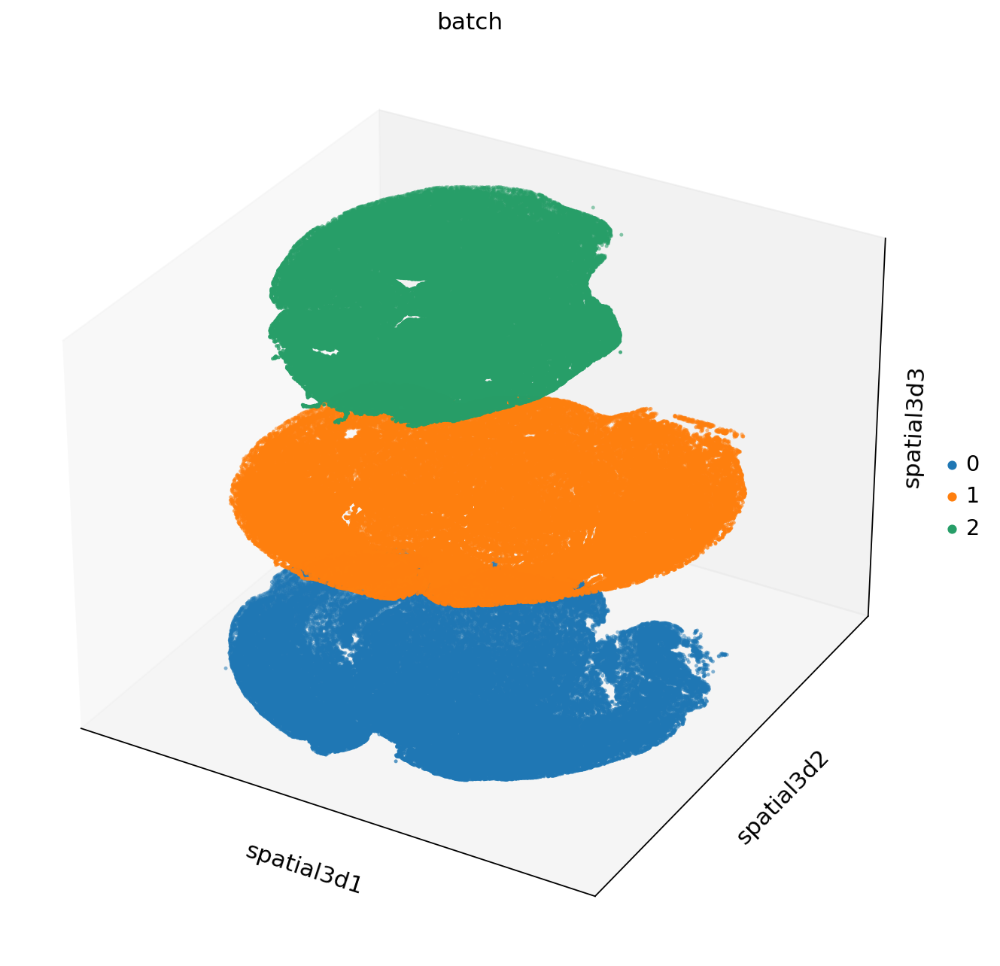

In [16]:
sc.set_figure_params(figsize=(10, 10))
sc.pl.embedding(adata, basis="spatial3d", projection="3d", color="batch")

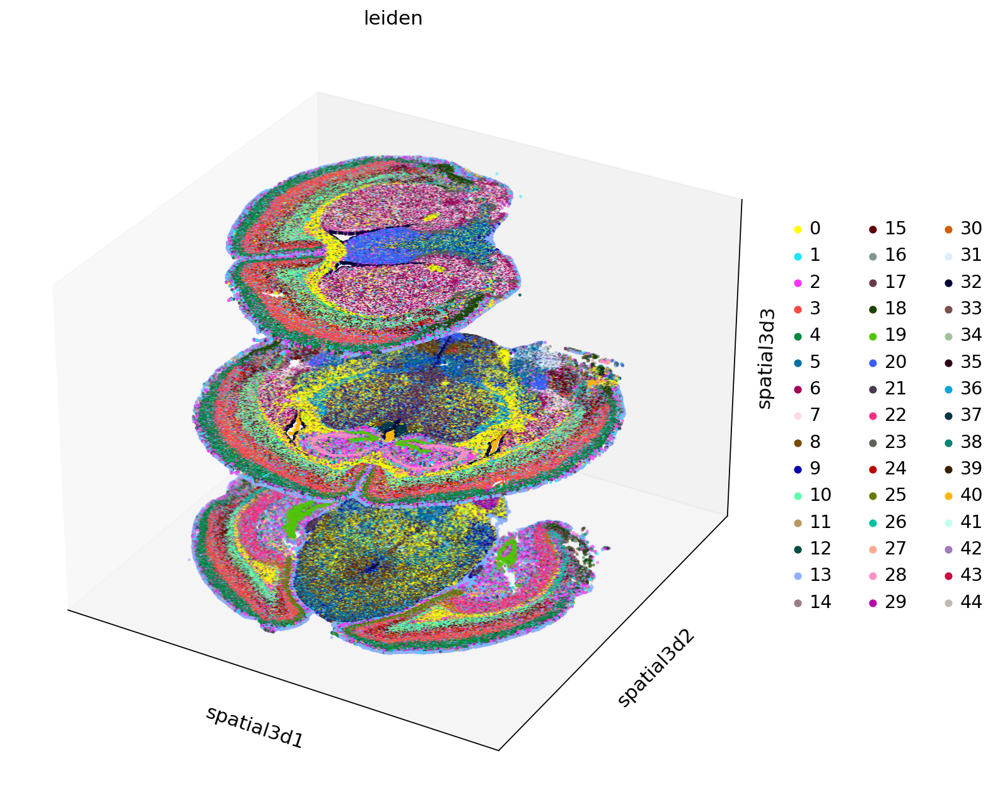

In [17]:
sc.pl.embedding(adata, basis="spatial3d", projection="3d", color="leiden")

In [19]:
adata

AnnData object with n_obs × n_vars = 232719 × 649
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'batch', 'leiden', 'z_stack'
    uns: 'neighbors', 'umap', 'leiden', 'batch_colors', 'leiden_colors'
    obsm: 'spatial', 'X_scanorama', 'X_umap', 'spatial3d'
    obsp: 'distances', 'connectivities'

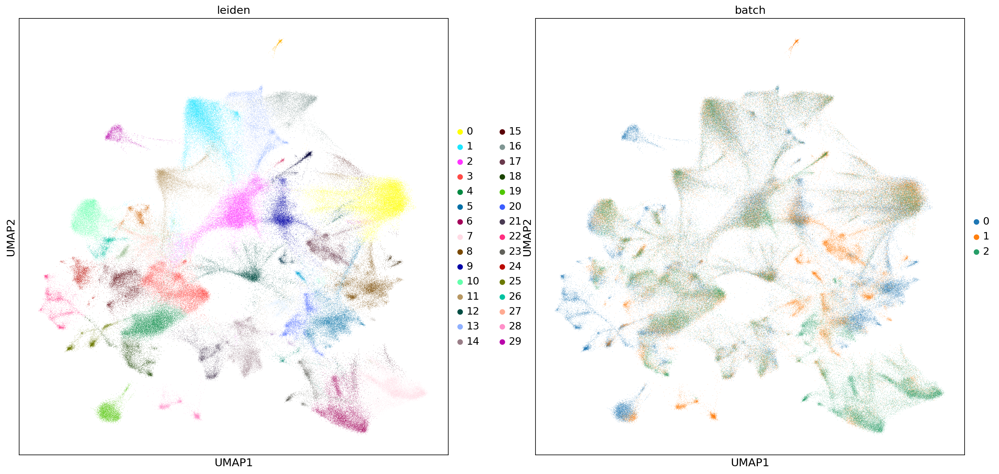

In [18]:
sc.pl.umap(adata, color=["leiden", "batch"])

In [38]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.registration import phase_cross_correlation
from skimage.transform import warp_polar, rotate, rescale
from skimage.util import img_as_float
from skimage.color import rgb2gray
from skimage.filters import window, difference_of_gaussians
from scipy.fftpack import fft2, fftshift

In [39]:
# First, band-pass filter both images
image = difference_of_gaussians(adata_list[1].X, 5, 20)
rts_image = difference_of_gaussians(adata_list[0].X, 5, 20)

# window images
wimage = image * window('hann', image.shape)
rts_wimage = rts_image * window('hann', image.shape)



ValueError: Can not convert from object to float64.

In [ ]:
# work with shifted FFT magnitudes
image_fs = np.abs(fftshift(fft2(wimage)))
rts_fs = np.abs(fftshift(fft2(rts_wimage)))

# Create log-polar transformed FFT mag images and register
shape = image_fs.shape
radius = shape[0] // 8  # only take lower frequencies
warped_image_fs = warp_polar(image_fs, radius=radius, output_shape=shape,
                             scaling='log', order=0)
warped_rts_fs = warp_polar(rts_fs, radius=radius, output_shape=shape,
                           scaling='log', order=0)

warped_image_fs = warped_image_fs[:shape[0] // 2, :]  # only use half of FFT
warped_rts_fs = warped_rts_fs[:shape[0] // 2, :]
shifts, error, phasediff = phase_cross_correlation(warped_image_fs,
                                                   warped_rts_fs,
                                                   upsample_factor=10)

# Use translation parameters to calculate rotation and scaling parameters
shiftr, shiftc = shifts[:2]
recovered_angle = (360 / shape[0]) * shiftr
klog = shape[1] / np.log(radius)
shift_scale = np.exp(shiftc / klog)

In [19]:
sq.gr.spatial_neighbors(adata, coord_type="generic", delaunay=True)

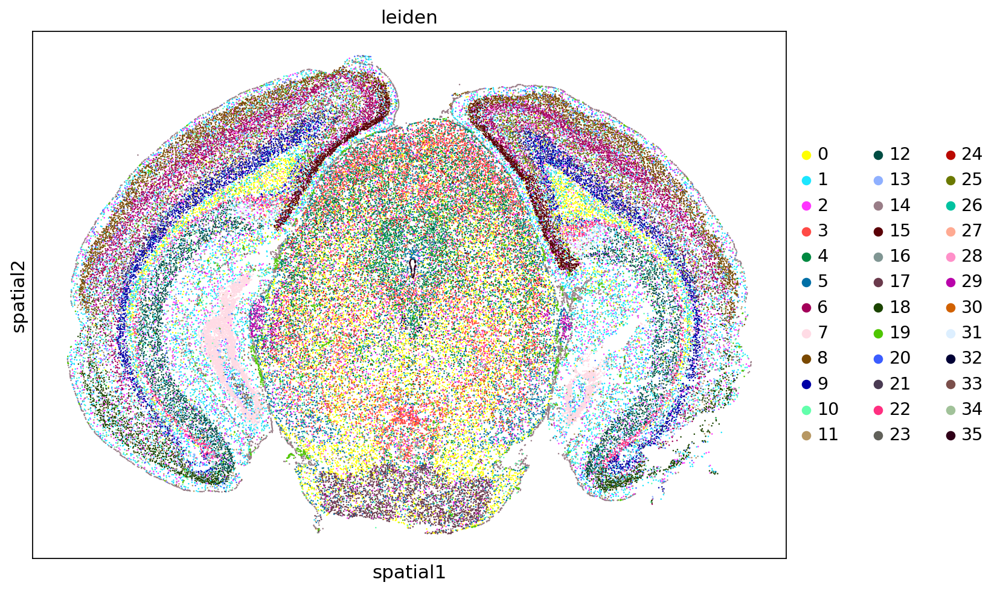

In [25]:
sc.set_figure_params(figsize=(10, 10))
sc.pl.spatial(adata, color="leiden", spot_size=20)

In [29]:
adata.shape

(78329, 649)

This dataset is added to tutorial

In [3]:
counts = pd.read_csv(
    BASE_PATH
    / "datasets_mouse_brain_map_BrainReceptorShowcase_Slice2_Replicate1_cell_by_gene_S2R1.csv",
    index_col=0,
)

In [4]:
metadata = pd.read_csv(
    BASE_PATH
    / "datasets_mouse_brain_map_BrainReceptorShowcase_Slice2_Replicate1_cell_metadata_S2R1.csv",
    index_col=0,
)

In [5]:
np.testing.assert_array_equal(metadata.index.values, counts.index.values)

In [6]:
counts.reset_index(inplace=True, drop=True)
metadata.reset_index(inplace=True, drop=True)

In [7]:
from anndata import AnnData
import scipy

genes = counts.columns.values
counts = scipy.sparse.csr_matrix(counts.to_numpy())
counts.eliminate_zeros()
adata = AnnData(counts, obs=metadata)
adata.var_names = genes

/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [8]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(
    adata,
)

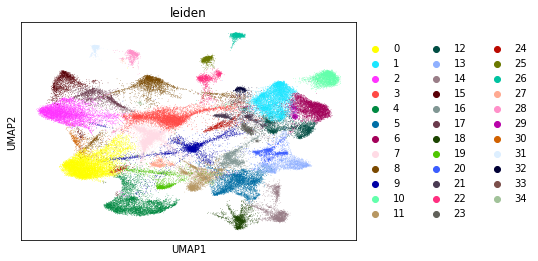

In [9]:
sc.pl.umap(adata, color="leiden")

In [10]:
adata.obsm["spatial"] = adata.obs[["center_x", "center_y"]].to_numpy()

In [11]:
sq.gr.spatial_neighbors(adata, coord_type="generic", delaunay=True)

In [12]:
adata.shape

(83546, 649)

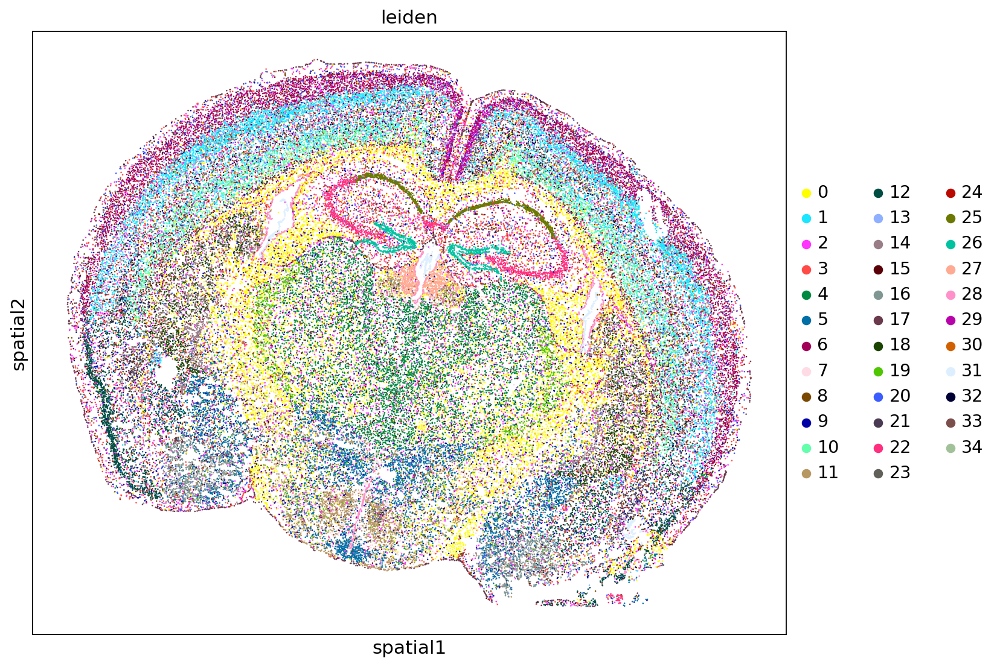

In [13]:
sc.set_figure_params(figsize=(10, 10))
sc.pl.spatial(adata, color="leiden", spot_size=20)

In [16]:
adata.obs

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,leiden
0,22,702.985117,638.564040,4594.216444,633.050640,644.077440,4588.373644,4600.059245,3
1,22,1601.521287,593.803439,4516.240442,584.666639,602.940239,4504.889642,4527.591243,17
2,22,999.080438,597.313439,4566.676444,589.202639,605.424239,4557.485643,4575.867244,17
3,22,1343.252320,613.243439,4609.498445,606.482639,620.004239,4600.469645,4618.527245,17
4,22,791.421453,609.193439,4603.180445,602.594639,615.792239,4596.041644,4610.319245,17
...,...,...,...,...,...,...,...,...,...
83541,1362,1287.925067,9358.279627,4260.179008,9347.684827,9368.874427,4250.718208,4269.639809,17
83542,1362,1077.598116,9334.573626,4392.101012,9326.408826,9342.738427,4381.722211,4402.479812,2
83543,1362,724.988088,9342.349627,4285.073009,9336.344826,9348.354427,4278.366209,4291.779809,3
83544,1362,1926.005095,9350.503627,4398.743012,9339.584826,9361.422427,4388.202212,4409.283812,17


In [14]:
adata.var_names

Index(['Oxgr1', 'Htr1a', 'Htr1b', 'Htr1d', 'Htr1f', 'Htr2a', 'Htr2b', 'Htr2c',
       'Htr4', 'Htr5a',
       ...
       'Blank-156', 'Blank-157', 'Blank-158', 'Blank-159', 'Blank-160',
       'Blank-161', 'Blank-162', 'Blank-163', 'Blank-164', 'Blank-165'],
      dtype='object', length=649)

In [15]:
adata.write(
    "/storage/groups/ml01/datasets/raw/20201214_SquidpyData_giovanni.palla/tutorial_data/merfish_vizgen.h5ad"
)